In [144]:
# Import all the necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from dataprep.eda import *
from dataprep.datasets import load_dataset
from dataprep.eda import plot, plot_correlation, plot_missing, plot_diff, create_report
import seaborn as sns 
from scipy import stats
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
import sklearn.metrics as sm
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
import plotly.express as px
# ! pip install bar_chart_race
import bar_chart_race as bcr
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

## EDA

In [145]:
# Use the datafile "Life Expectancy data.csv" from https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who

df = pd.read_csv('Life Expectancy Data.csv') # access and read the datafile 
# print('The first five rows of dataset df are:\n', df.head(), '\n') # print df

# For each numeric column, NaN are substituted by the mean value of the column
for jj in range(3, len(df.columns)):
    column_now = df.columns[jj]
    mean_column = df[column_now].mean()
    df[column_now].fillna(value = mean_column, inplace=True)
print('The shape of the dataset to is', df.shape, '\n') # print the shape of df

# All the features are here saved 
country = df['Country'] # name of the country
year = df['Year'] # year data refer to
status = df['Status'] # country status
life_expectancy = df['Life expectancy '] # life expectancy
adult_mortality = df['Adult Mortality'] # adult mortality
infant_deaths = df['infant deaths'] # number infant deaths
alcohol = df['Alcohol'] # average alcohol use
percentage_expenditure = df['percentage expenditure'] # percentage of expenditure
hepatitis_b = df['Hepatitis B'] # prevalence of hepatitis b
measles = df['Measles '] # prevalence of measles
bmi = df[' BMI '] # body mass index
under_five_deaths = df['under-five deaths '] # under five deaths
polio = df['Polio'] # prevalence of polio
total_expenditure = df['Total expenditure'] # total expenditure
diphtheria = df['Diphtheria '] # prevalence of diphtheria
hiv_aids = df[' HIV/AIDS'] # prevalence of HIV/AIDS
gdp = df['GDP'] # ground domestic product
population = df['Population'] # number of people
thinness_1_19 = df[' thinness  1-19 years'] # thinness 1-19
thinness_5_9 = df[' thinness 5-9 years'] # thinness 5-9
income_composition = df['Income composition of resources'] # income composition of resources
schooling = df['Schooling'] # prevalence of schooling

# Since there are some problems in some features names a new dataframe with the all the columns above is created and will be used throughout the notebook
df_bis = pd.DataFrame({'country': country,
                       'year': year,
                       'status': status, 
                       'life_expectancy': life_expectancy, 
                       'adult_mortality': adult_mortality, 
                       'infant_deaths': infant_deaths,
                       'alcohol': alcohol, 
                       'percentage_expenditure': percentage_expenditure, 
                       'hepatitis_b': hepatitis_b, 
                       'measles': measles, 
                       'bmi': bmi, 
                       'under_five_deaths': under_five_deaths, 
                       'polio': polio, 
                       'total_expenditure': total_expenditure, 
                       'diphtheria': diphtheria, 
                       'hiv_aids': hiv_aids, 
                       'gdp': gdp, 
                       'population': population, 
                       'thinness_1_19': thinness_1_19, 
                       'thinness_5_9': thinness_5_9, 
                       'income_composition': income_composition, 
                       'schooling': schooling})

# For same countries column 'status' is wrong. This was fixed here
df_bis.loc[df_bis['country'] == 'Canada', 'status'] = 'Developed'
df_bis.loc[df_bis['country'] == 'Finland', 'status'] = 'Developed'
df_bis.loc[df_bis['country'] == 'France', 'status'] = 'Developed'
df_bis.loc[df_bis['country'] == 'Greece', 'status'] = 'Developed'
df_bis.loc[df_bis['country'] == 'Israel', 'status'] = 'Developed'

# Some rows are removed. For same countries data are available for one year only
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Cook Islands'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Dominica'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Marshall Islands'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Monaco'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Nauru'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Niue'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Palau'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Saint Kitts and Nevis'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'San Marino'].index, axis = 0)
df_bis = df_bis.drop(df_bis[df_bis['country'] == 'Tuvalu'].index, axis = 0)

# replace the binary categorical feature status into a 0/1 feature
df_bis.status.replace(('Developing', 'Developed'), (0, 1), inplace = True) 

print('The first five rows of dataset df_bis are:\n', df_bis.head(), '\n') # print df_bis

# Additional dataset with encoding for features country and status, which are the only two categorical variables
df_bis_enc = df_bis
# use the one hot encoding to the remaining categorical feature country
enc_data = pd.get_dummies(df_bis_enc['country'])
df_bis_enc = pd.concat([df_bis_enc, enc_data], axis = 1)
df_bis_enc = df_bis_enc.drop(['country'], axis = 1)
# print('The first five rows of dataset df_bis_enc are:\n', df_bis_enc.head(), '\n') # print df_bis_enc

The shape of the dataset to is (2938, 22) 

The first five rows of dataset df_bis are:
        country  year  status  life_expectancy  adult_mortality  infant_deaths  \
0  Afghanistan  2015       0             65.0            263.0             62   
1  Afghanistan  2014       0             59.9            271.0             64   
2  Afghanistan  2013       0             59.9            268.0             66   
3  Afghanistan  2012       0             59.5            272.0             69   
4  Afghanistan  2011       0             59.2            275.0             71   

   alcohol  percentage_expenditure  hepatitis_b  measles  ...  polio  \
0     0.01               71.279624         65.0     1154  ...    6.0   
1     0.01               73.523582         62.0      492  ...   58.0   
2     0.01               73.219243         64.0      430  ...   62.0   
3     0.01               78.184215         67.0     2787  ...   67.0   
4     0.01                7.097109         68.0     3013  ...   6

In [146]:
# Creation of a first report to highlight important aspects
# create_report(df_bis)

In [147]:
# Based on the report above features thinness_1_19-thinness_5_9, income_composition-schooling, gdp_percentage_expenditure, and infant_deaths-under_five_deaths are highly correlated. 
# Thus, feature thinness_5_9, schooling, percentage_expenditure, and under_five_deaths are removed from df_bis, df_bis_enc
df_bis = df_bis.drop(columns = ['thinness_5_9'])
df_bis_enc = df_bis_enc.drop(columns = ['thinness_5_9'])
df_bis = df_bis.drop(columns = ['schooling'])
df_bis_enc = df_bis_enc.drop(columns = ['schooling'])
df_bis = df_bis.drop(columns = ['percentage_expenditure'])
df_bis_enc = df_bis_enc.drop(columns = ['percentage_expenditure'])
df_bis = df_bis.drop(columns = ['under_five_deaths'])
df_bis_enc = df_bis_enc.drop(columns = ['under_five_deaths'])

# Also adult mortality and life_expectancy are strongly related to each other. That is logical: if adult motality is known, life expectancy is easily predictable.
# For this reason, adult mortality is removed from df_bis, df_bis_enc
df_bis = df_bis.drop(columns = ['adult_mortality'])
df_bis_enc = df_bis_enc.drop(columns = ['adult_mortality'])

# Feature year can be neglected for now 
# df_bis = df_bis.drop(columns = ['year'])
# df_bis_enc = df_bis_enc.drop(columns = ['year'])

  0%|                                                   | 0/364 [00:00<?, ?it/s]


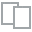
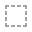
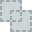
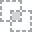
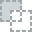
...
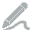
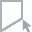
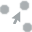
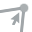
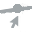

In [148]:
# To better understand how df_bis is correlated to life_expectancy, the target variable for this problem, we use plot_correlation
plot_correlation(df_bis, 'life_expectancy')

As one imposes a threshold for significant correlation (no less than 0.5 and no more than -0.5), the most important variables will be income_composition, hiv_aids prevalence, and bmi. The relationship between life expectancy and each of this four variables is shown below.

  0%|                                                     | 0/9 [00:00<?, ?it/s]


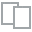
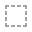
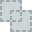
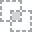
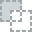
...
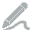
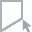
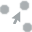
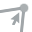
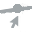

In [149]:
plot(df_bis, 'life_expectancy', 'income_composition')

  0%|                                                     | 0/9 [00:00<?, ?it/s]


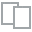
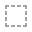
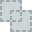
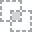
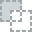
...
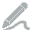
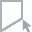
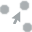
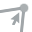
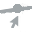

In [150]:
plot(df_bis, 'life_expectancy', 'hiv_aids')

  0%|                                                     | 0/9 [00:00<?, ?it/s]


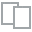
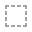
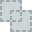
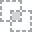
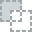
...
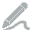
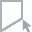
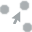
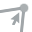
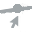

In [151]:
plot(df_bis, 'life_expectancy', 'bmi')

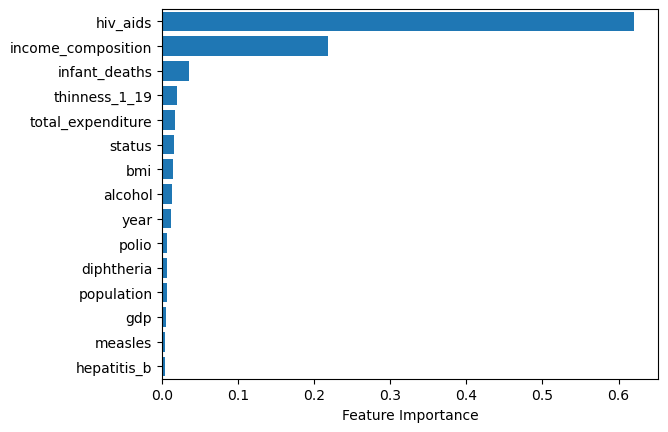

In [152]:
# Permutation importance plot to identify the most important variables 

X = df_bis.drop(columns = ['country', 'life_expectancy'])
Y = df_bis['life_expectancy']

# Random Forest model to identify the most important features and permutation_importance. 
rfr = RandomForestRegressor(n_estimators = 100, random_state = 42).fit(X, Y)
perm_import = permutation_importance(rfr, X, Y, n_repeats = 10, random_state = 42)

# The permutation importance plot follows the same lines of code reported in Permutation Importance with Multicollinear or Correlated Features (n.d.).
importance_idx = np.argsort(rfr.feature_importances_)
importance_indices = np.arange(0, len(rfr.feature_importances_)) + 0.5
fig, ax = plt.subplots()
ax.barh(importance_indices, rfr.feature_importances_[importance_idx], height = 0.8)
ax.set_yticks(importance_indices)
ax.set_yticklabels(X.columns.values[importance_idx])
ax.set_ylim((0, len(rfr.feature_importances_)))
ax.set_xlabel('Feature Importance')
plt.show()

# References:
# Permutation Importance with Multicollinear or Correlated Features. (n.d.). Scikit Learn. Retrieved May 15, 2023, from https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance_multicollinear.html#:~:text=The%20permutation%20importance%20plot%20shows,some%20feature%20must%20be%20important

The permutation plot above is in accordance to the the most important variables identified through the correlation plot. Please not that thinness1_19 and bmi are correlated. 

The dataset df_bis is unbalanced in terms of status. Thus, we split df_bis into two different dataframes to compare life expectancy for developed (status = 1) and developing countries (status = 0).


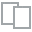
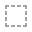
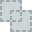
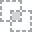
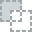
...
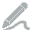
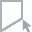
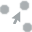
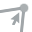
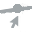

In [153]:
df_bis_0 = df_bis[df_bis["status"] == 0] # dataframe for developing countries
df_bis_1 = df_bis[df_bis["status"] == 1] # dataframe for developed countries
plot_diff([df_bis_0, df_bis_1]) # comparing the two dataframes

Based on the graph above, it is clear that some feature, like hiv_aids, are more important than others. Thus, we analyzed the permutation importance plot in both developing and developed countries. Results are shown in the following. 

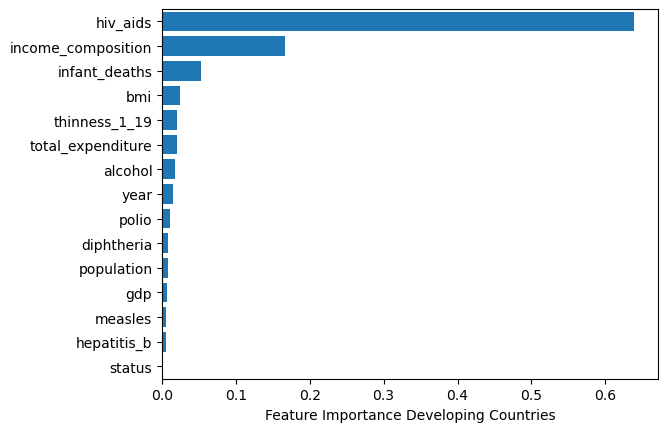

In [154]:
# Permutation importance plot to identify the most important variables in Developing Countries

X = df_bis_0.drop(columns = ['country', 'life_expectancy'])
Y = df_bis_0['life_expectancy']

# Random Forest model to identify the most important features and permutation_importance.
rfr = RandomForestRegressor(n_estimators = 100, random_state = 42).fit(X, Y)
perm_import = permutation_importance(rfr, X, Y, n_repeats = 10, random_state = 42)

# The permutation importance plot follows the same lines of code reported in Permutation Importance with Multicollinear or Correlated Features (n.d.).
importance_idx = np.argsort(rfr.feature_importances_)
importance_indices = np.arange(0, len(rfr.feature_importances_)) + 0.5
fig, ax = plt.subplots()
ax.barh(importance_indices, rfr.feature_importances_[importance_idx], height = 0.8)
ax.set_yticks(importance_indices)
ax.set_yticklabels(X.columns.values[importance_idx])
ax.set_ylim((0, len(rfr.feature_importances_)))
ax.set_xlabel('Feature Importance Developing Countries')
plt.show()

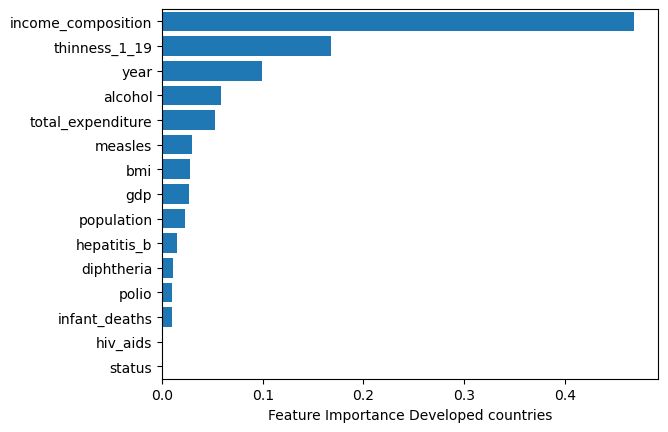

In [155]:
# Permutation importance plot to identify the most important variables in Developed Countries

X = df_bis_1.drop(columns = ['country', 'life_expectancy'])
Y = df_bis_1['life_expectancy']

# Random Forest model to identify the most important features and permutation_importance.
rfr = RandomForestRegressor(n_estimators = 100, random_state = 42).fit(X, Y)
perm_import = permutation_importance(rfr, X, Y, n_repeats = 10, random_state = 42)

# The permutation importance plot follows the same lines of code reported in Permutation Importance with Multicollinear or Correlated Features (n.d.).
importance_idx = np.argsort(rfr.feature_importances_)
importance_indices = np.arange(0, len(rfr.feature_importances_)) + 0.5
fig, ax = plt.subplots()
ax.barh(importance_indices, rfr.feature_importances_[importance_idx], height = 0.8)
ax.set_yticks(importance_indices)
ax.set_yticklabels(X.columns.values[importance_idx])
ax.set_ylim((0, len(rfr.feature_importances_)))
ax.set_xlabel('Feature Importance Developed countries')
plt.show()

The two graphs above show an interesting result: feature hiv_aids is the most important one while predicting life_expectancy in developing contries, while it is not relevant in developed countries. Other features, instead, like income_composition and total_expenditure are relevant variables for both developed and developing countries. 

In [156]:
# Function to build a dataset including as many columns as the number of developing countries and as many rows as the number of years data are available for each country

def le_evolution(data):
    countries = data.country.unique()
    country_time = pd.DataFrame({'year': data[data['country'] == countries[0]]['year'].iloc[::-1]})
    for jj in range(0, len(countries)):
        add_df = pd.DataFrame({'year': data[data['country'] == countries[jj]]['year'],
                               countries[jj]: data[data['country'] == countries[jj]]['life_expectancy']})
        country_time = pd.merge(country_time, add_df, on = 'year', how = 'outer')

    # The year column is converted into a date, which is then set as index 
    country_time['year'] = country_time['year'].astype('str') + "-01-01" # modify the column 'year', chosen date format y-m-d
    country_time['date'] = pd.to_datetime(country_time['year']) # add column 'date' 
    country_time = country_time.drop(columns = ['year']) # remove column 'year'
    country_time = country_time.set_index('date') # set date as index
    return country_time

In [157]:
# Evolution of life expectancy in developing croutries from 2000 to 2015
le_evolution0 = le_evolution(df_bis_0)
bcr.bar_chart_race(df = le_evolution0, 
                   n_bars = 5, 
                   steps_per_period = 20, 
                   period_length = 2000,
                   filter_column_colors = True,
                   title = 'Top five developing countries for life expectancy from 2000 to 2015'
                   )

Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
figure size in inches has been adjusted from 8.002500000000001 x 3.5 to 8.0 x 3.5
MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1152x504 -pix_fmt rgba -r 10.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/8s/dxqh3g992w1fh3l3dtpqs_jw0000gn/T/tmpx6e_b_ok/temp.m4v


In [158]:
# Evolution of life expectancy in developed croutries from 2000 to 2015
le_evolution1 = le_evolution(df_bis_1)
bcr.bar_chart_race(df = le_evolution1, 
                   n_bars = 5, 
                   steps_per_period = 20, 
                   period_length = 2000,
                   filter_column_colors = True,
                   title = 'Top five developed countries for life expectancy from 2000 to 2015'
                   )

Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
figure size in inches has been adjusted from 8.5175 x 3.5 to 8.51388888888889 x 3.5
MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1226x504 -pix_fmt rgba -r 10.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/8s/dxqh3g992w1fh3l3dtpqs_jw0000gn/T/tmp5cxma9kc/temp.m4v


## MODELS

# Naive Bayes Classifier Object: predicting the status of a set of countries as all the other variables are known (country and life_expectancy feature excluded)

Train Accuracy: 0.86
Test Accuracy: 0.83
Recall: 0.83
F1 Score: 0.82


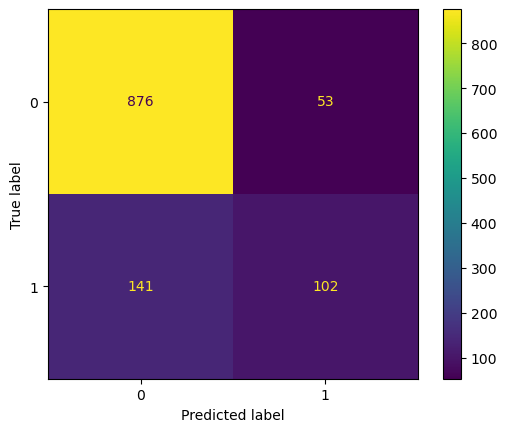

In [159]:
# Response and predictor variables 
X2 = df_bis.drop(columns = ['country', 'status'])
Y2 = df_bis['status']

# Train and target response/predictor variables
X2_train, X2_test, Y2_train, Y2_test = train_test_split(X2, Y2, test_size=0.4, random_state=1) # 70% training and 30% test

# Naive Bayes Classifier
nbc = GaussianNB(var_smoothing = 1e-8) # create the naive bayes classifer object
nbc = nbc.fit(X2_train, Y2_train) # fit the model

# Evaluating the NB classifier
Y2_hat = nbc.predict(X2_train) # predict the response for train dataset
Y2_pred = nbc.predict(X2_test) # predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", round(metrics.accuracy_score(Y2_train, Y2_hat), 2))
print("Test Accuracy:", round(metrics.accuracy_score(Y2_test, Y2_pred), 2))
print("Recall:", round(metrics.recall_score(Y2_test, Y2_pred, average = "weighted"), 2))
print("F1 Score:", round(metrics.f1_score(Y2_test, Y2_pred,  average = "weighted"), 2))

# Create the confusion matrix
cm = metrics.confusion_matrix(Y2_test, Y2_pred)
metrics.ConfusionMatrixDisplay(confusion_matrix = cm).plot()
plt.show()

# Regression Decision Tree Model: predicting life expectancy for developed and developing countries (country feature excluded)

In order to better evaluate the performance of the regression tree model, we exploit two different parameters: the mean squared error and the R2 score. The mean squared error is the average squared difference between expected (true) and predicted values. The R2 score is  the coefficient of determination and it tells us how well true values can be predicted by the model. 

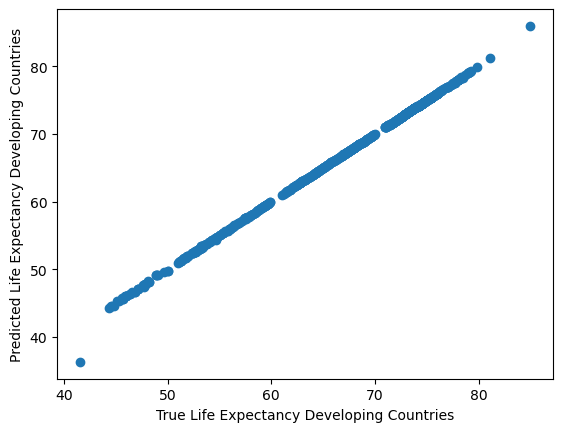

Mean squared error developing Countries: 0.04
R2 score developing Countries: 1.0


In [160]:
# Response and predictor variables in developing countries
X0 = df_bis_0.drop(columns = ['country'])
Y0 = df_bis_0['life_expectancy']

# Train and target response/predictor variables in developing countries
X0_train, X0_test, Y0_train, Y0_test = train_test_split(X0, Y0, test_size = 0.3, random_state = 1) # 70% training and 30% test

# Decision tree regressor for developing countries
dtr0 = DecisionTreeRegressor(random_state = 44) # create the regression tree model object
dtr0.fit(X0_train, Y0_train) # filt the model 
pred_le0 = dtr0.predict(X0_test) # predicted life expectancy for developing countries
expe_le0 = Y0_test # expected life expectancy for developing countries 

# Model performance for developing countries

# Scatter plot, expected and predicted life expectancy
plt.scatter(expe_le0, pred_le0)
plt.xlabel('True Life Expectancy Developing Countries')
plt.ylabel('Predicted Life Expectancy Developing Countries')
plt.show()

# Mean squared error and R2 score 
print("Mean squared error developing Countries:", round(sm.mean_squared_error(expe_le0, pred_le0), 2)) 
print("R2 score developing Countries:", round(sm.r2_score(expe_le0, pred_le0), 2))

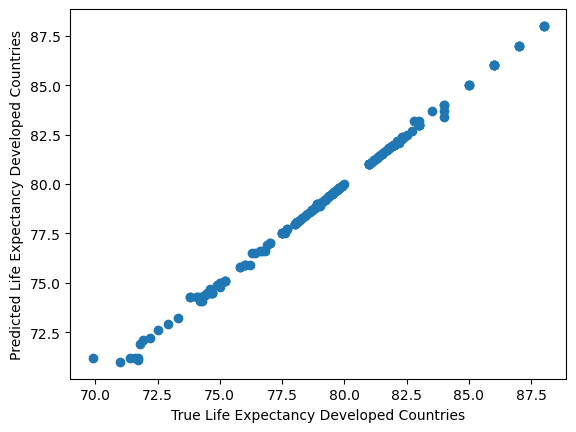

Mean squared error developed countries: 0.02
R2 score developed countries: 1.0


In [161]:
# Response and predictor variables in developed countries
X1 = df_bis_1.drop(columns = ['country'])
Y1 = df_bis_1['life_expectancy']

# Train and target response/predictor variables in developed countries
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1, Y1, test_size = 0.3, random_state = 1) # 70% training and 30% test

# Decision tree regressor for developed countries
dtr1 = DecisionTreeRegressor(random_state = 44) # create the regression tree model object
dtr1.fit(X1_train, Y1_train) # filt the model 
pred_le1 = dtr1.predict(X1_test) # predicted life expectancy for developed countries
expe_le1 = Y1_test # expected life expectancy for developed countries 

# Model performance for developed countries

# Scatter plot, expected and predicted life expectancy
plt.scatter(expe_le1, pred_le1)
plt.xlabel('True Life Expectancy Developed Countries')
plt.ylabel('Predicted Life Expectancy Developed Countries')
plt.show()

# Mean squared error and R2 score 
print("Mean squared error developed countries:", round(sm.mean_squared_error(expe_le1, pred_le1), 2)) 
print("R2 score developed countries:", round(sm.r2_score(expe_le1, pred_le1), 2))

# Time Series Forecasting: predicting life expectancy for a given country

In [211]:
# Function to forecast life expectancy based on past values

def forecast_le(train_data, test_data):

    # Use an ARIMAmodel by following the same procedure described by Sadrach (n.d.)
    # Reference: Sadrach, P. (n.d.). A Guide to Time Series Forecasting in Python. Built In. https://builtin.com/data-science/time-series-forecasting-python
    ARIMAmodel = ARIMA(train_data, order = (2, 2, 2)) # define the model 
    ARIMAmodel = ARIMAmodel.fit() # fit the model 
    df_ts_pred = ARIMAmodel.get_forecast(len(test_data.index)) # get_forecast 
    df_ts_pred_df = df_ts_pred.conf_int(alpha = 0.05) # impose the confidence interval such that both upper and lower bounds around the prediction are available
    df_ts_pred_df['predictions'] = ARIMAmodel.predict(start = df_ts_pred_df.index[0], end = df_ts_pred_df.index[-1]) # predictions
    df_ts_pred_df.index = df_ts_test.index # define the indexes
    predictions = df_ts_pred_df['predictions'] # save the predictions

    # Calculate the root-mean-squared error
    df_ts_rmse = np.sqrt(mean_squared_error(df_ts_test, predictions))
    return predictions, df_ts_rmse

The root-mean-squared error for life expectancy in Italy  is 0.24 



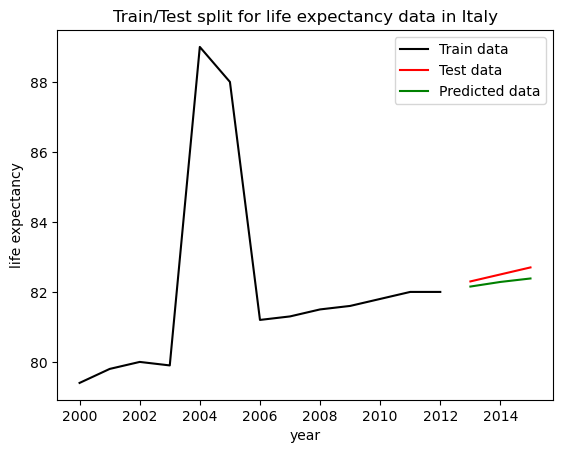

In [212]:
# Choose the country one wants to predict life expectancy in the future
# COUNTRY = input('Enter the country one wants to predict life expectancy: ')
COUNTRY = 'Italy' # chosen country
STATUS = df_bis[df_bis['country'] == COUNTRY]['status'].unique()[0] # status of the chosen country

# Choose the dataset to use depending on flag_developing: le_evolution0 if flag_developing == 1 or le_evolution1 if fleag_developing == 0
if STATUS == 0: 
    df_ts = le_evolution0[COUNTRY]

else:
    df_ts = le_evolution1[COUNTRY]

# Define the data for training and testing
df_ts_train = df_ts[df_ts.index <= pd.to_datetime("2012-01-01", format = '%Y-%m-%d')] # data before 2012-01-01 are used for training 
df_ts_test = df_ts[df_ts.index >= pd.to_datetime("2013-01-01", format = '%Y-%m-%d')] # data after 2012-01-01 are used for testing 
# Call the forecast_le() function
predictions_COUNTRY, rmse_COUNTRY = forecast_le(df_ts_train, df_ts_test)
# Show model results
print('The root-mean-squared error for life expectancy in '+COUNTRY, ' is', round(rmse_COUNTRY, 2), '\n')
plt.plot(df_ts_train, color = 'black', label = 'Train data')
plt.plot(df_ts_test, color = 'red', label = 'Test data')
plt.plot(predictions_COUNTRY, color = 'green', label = 'Predicted data')
plt.legend() 
plt.ylabel('life expectancy')
plt.xlabel('year')
plt.title('Train/Test split for life expectancy data in '+COUNTRY)
plt.show()

In [213]:
# Evaluate the root-mean-squared error for all developing and developed countries by using function forecast_le

# Developing countries
list_countries0 = df_bis_0.country.unique() # list of developing countries
erms_countries0 = [] # list to save the erms for each developing country
for jj in range(len(list_countries0)):
    COUNTRY = list_countries0[jj] 
    le_evolution0_train = le_evolution0[COUNTRY][le_evolution0[COUNTRY].index <= pd.to_datetime("2012-01-01", format = '%Y-%m-%d')] # data before 2012-01-01 are used for training 
    le_evolution0_test = le_evolution0[COUNTRY][le_evolution0[COUNTRY].index >= pd.to_datetime("2013-01-01", format = '%Y-%m-%d')] # data after 2012-01-01 are used for testing 
    predictions_COUNTRY, erms_COUNTRY = forecast_le(le_evolution0_train, le_evolution0_test)
    erms_countries0.append(erms_COUNTRY) 
predictions_countries0 = pd.DataFrame({'country': list_countries0, 'erms': erms_countries0}) # dataframe showing the erms for all developing countries
predictions_countries0 = predictions_countries0.set_index('country') # set country as index

# Developed countries 
list_countries1 = df_bis_1.country.unique() # list of developed countries
erms_countries1 = [] # list to save the erms for each developed country
for jj in range(len(list_countries1)):
    COUNTRY = list_countries1[jj] 
    le_evolution1_train = le_evolution1[COUNTRY][le_evolution1[COUNTRY].index <= pd.to_datetime("2012-01-01", format = '%Y-%m-%d')] # data before 2012-01-01 are used for training 
    le_evolution1_test = le_evolution1[COUNTRY][le_evolution1[COUNTRY].index >= pd.to_datetime("2013-01-01", format = '%Y-%m-%d')] # data after 2012-01-01 are used for testing 
    predictions_COUNTRY, erms_COUNTRY = forecast_le(le_evolution1_train, le_evolution1_test)
    erms_countries1.append(erms_COUNTRY) 
predictions_countries1 = pd.DataFrame({'country': list_countries1, 'erms': erms_countries1}) # dataframe showing the erms for all developed countries
predictions_countries1 = predictions_countries1.set_index('country') # set country as index

In [218]:
summary_predictions0 = round(predictions_countries0.describe(), 2)
max_predictions0 = predictions_countries0['erms'].max()
min_predictions0 = predictions_countries0['erms'].min()
predictions_countries0['norm erms'] = predictions_countries0['erms'] / (max_predictions0 - min_predictions0) # add the normalized erms for all developing countries
print("Sample size, mean, standard deviation, and five number summary of the mean_squared_error for life expectancy in developing countries are reported below")
round(predictions_countries0['norm erms'].describe(), 2)

Sample size, mean, standard deviation, and five number summary of the mean_squared_error for life expectancy in developing countries are reported below


count    146.00
mean       0.15
std        0.11
min        0.01
25%        0.08
50%        0.13
75%        0.20
max        1.01
Name: norm erms, dtype: float64

In [219]:
summary_predictions1 = round(predictions_countries1.describe(), 2)
max_predictions1 = predictions_countries1['erms'].max()
min_predictions1 = predictions_countries1['erms'].min()
predictions_countries1['norm erms'] = predictions_countries1['erms'] / (max_predictions1 - min_predictions1) # add the normalized erms for all developed countries
print("Sample size, mean, standard deviation, and five number summary of the mean_squared_error for life expectancy in developed countries are reported below")
round(predictions_countries1['norm erms'].describe(), 2)

Sample size, mean, standard deviation, and five number summary of the mean_squared_error for life expectancy in developed countries are reported below


count    37.00
mean      0.12
std       0.17
min       0.00
25%       0.03
50%       0.10
75%       0.15
max       1.00
Name: norm erms, dtype: float64